<a href="https://colab.research.google.com/github/ancka019/ComputationsMethods/blob/main/HW3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
matplotlib.style.use('ggplot')
%matplotlib inline
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

In [13]:
import geopandas as gpd
import contextily as ctx

In [3]:
df = pd.read_csv('/content/ALL_SPB_STOPS.csv', sep=';', encoding='Windows-1251', decimal=',')

In [ ]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(df)

      ID_STOP                                          STOP_NAME  \
0      100101                                     Пр.Ветеранов-1   
1      100102                                     Пр.Ветеранов-2   
2      100103                                    Ленинский пр.-1   
3      100104                                    Ленинский пр.-2   
4      100105                                             Автово   
5      100106                                    Кировский завод   
6      100107                                           Нарвская   
7      100108                                         Балтийская   
8      100109                                         Пушкинская   
9      100110                                       Владимирская   
10     100111                                    Пл. Восстания-1   
11     100112                                    Пл. Восстания-2   
12     100113                                       Чернышевская   
13     100114                                   

In [5]:
metro = df[df['ID_STOP'].astype('str').str.match('100')]
metro

,ID_STOP,STOP_NAME,LATITUDE,LONGITUDE
0,100101,Пр.Ветеранов-1,59.8416038827508,30.2539842396693
1,100102,Пр.Ветеранов-2,59.8420417837763,30.25008403131
2,100103,Ленинский пр.-1,59.8516834239607,30.2683847248898
3,100104,Ленинский пр.-2,59.8497096845857,30.2683477910985
4,100105,Автово,59.8672920598579,30.2611327749718
...,...,...,...,...
70,100513,Чкаловская,59.9609866306347,30.2920463582738
71,100514,Крестовский остров,59.9717924205307,30.2594135069873
72,100515,Старая Деревня,59.9895383917864,30.2552178282978
73,100516,Комендантский пр.,60.0078102700019,30.2594762944325


In [21]:
List = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.LONGITUDE, df.LATITUDE))
List.crs = "EPSG:4326"
List

,ID_STOP,STOP_NAME,LATITUDE,LONGITUDE,geometry
0,100101,Пр.Ветеранов-1,59.8416038827508,30.2539842396693,POINT (30.25398 59.84160)
1,100102,Пр.Ветеранов-2,59.8420417837763,30.25008403131,POINT (30.25008 59.84204)
2,100103,Ленинский пр.-1,59.8516834239607,30.2683847248898,POINT (30.26838 59.85168)
3,100104,Ленинский пр.-2,59.8497096845857,30.2683477910985,POINT (30.26835 59.84971)
4,100105,Автово,59.8672920598579,30.2611327749718,POINT (30.26113 59.86729)
...,...,...,...,...,...
7149,4997,ЗАВОД ИМ. КАЛИНИНА [тест] <,59.95069505060761,30.2661324,POINT (30.26613 59.95070)
7150,4998,МАЛЫЙ ПР. В.О. ПО 9 ЛИНИИ [тест] <,59.94569778533688,30.2719688,POINT (30.27197 59.94570)
7151,5003,АДМИРАЛТЕЙСКИЙ ПР. [тест] <,59.93602605740318,30.3092594,POINT (30.30926 59.93603)
7152,7069,ПР. ЛУНАЧАРСКОГО(тест),60.03143940049296,30.3925724,POINT (30.39257 60.03144)


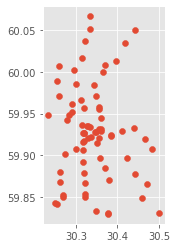

In [15]:
gmetro = gpd.GeoDataFrame(
    metro, geometry=gpd.points_from_xy(metro.LONGITUDE, metro.LATITUDE))
gmetro.crs = "EPSG:4326"
gmetro.plot()

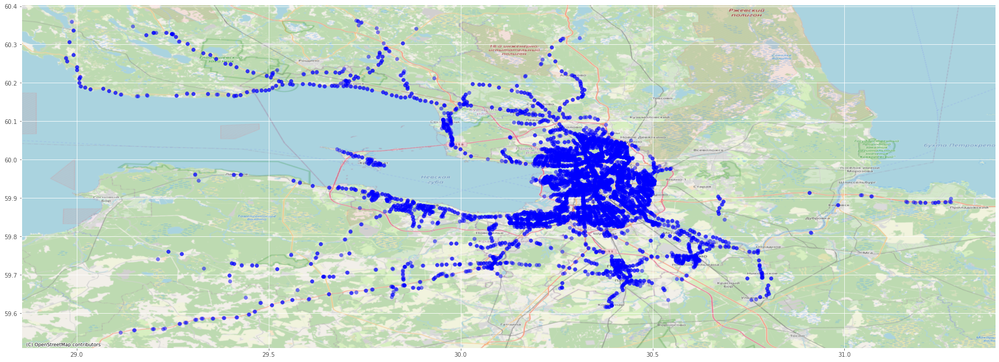

In [22]:
ax = List.plot(color="blue", figsize=(30, 30), alpha=0.5)
ctx.add_basemap(ax, 
                crs=gdf.crs.to_string(), 
                source=ctx.providers.OpenStreetMap.Mapnik)

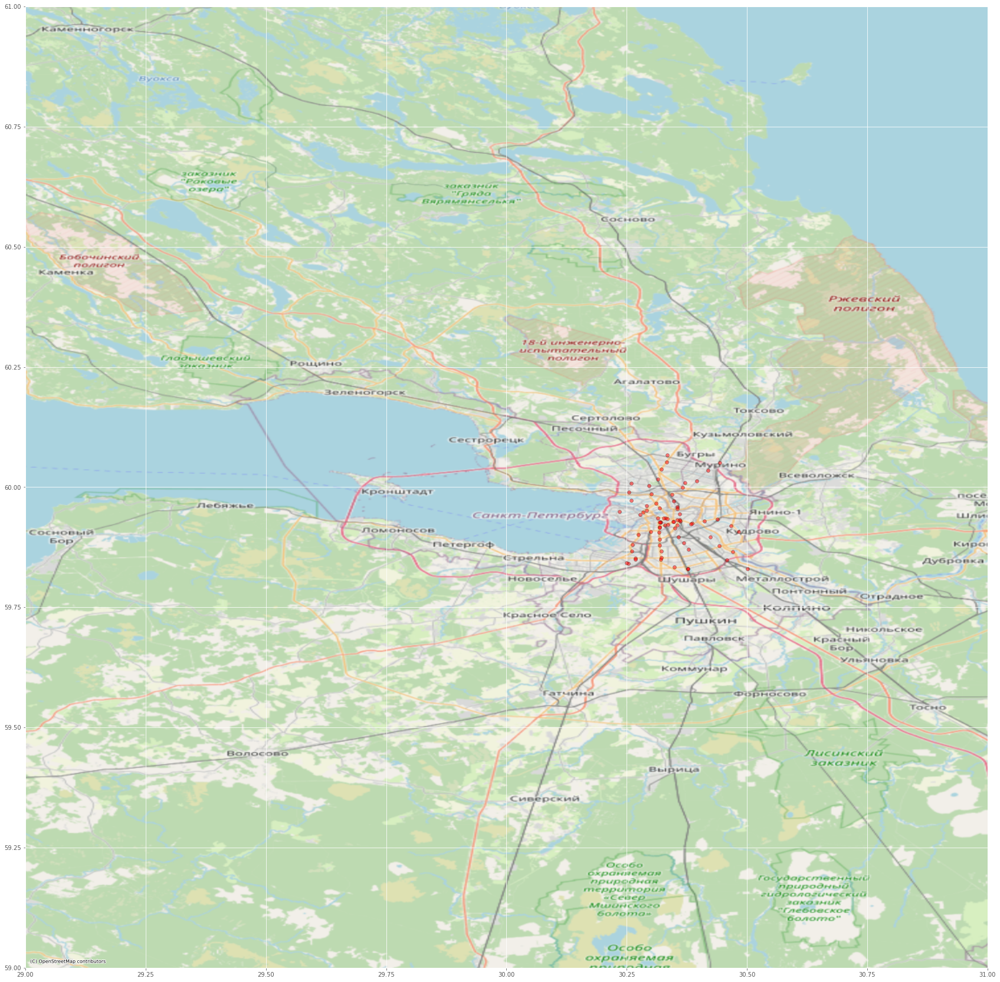

In [26]:
ax = gmetro.plot(color="red", figsize=(30, 30), alpha=0.5, edgecolor='k')
ax.axis((29, 31, 59, 61))
ctx.add_basemap(ax, crs=gmetro.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

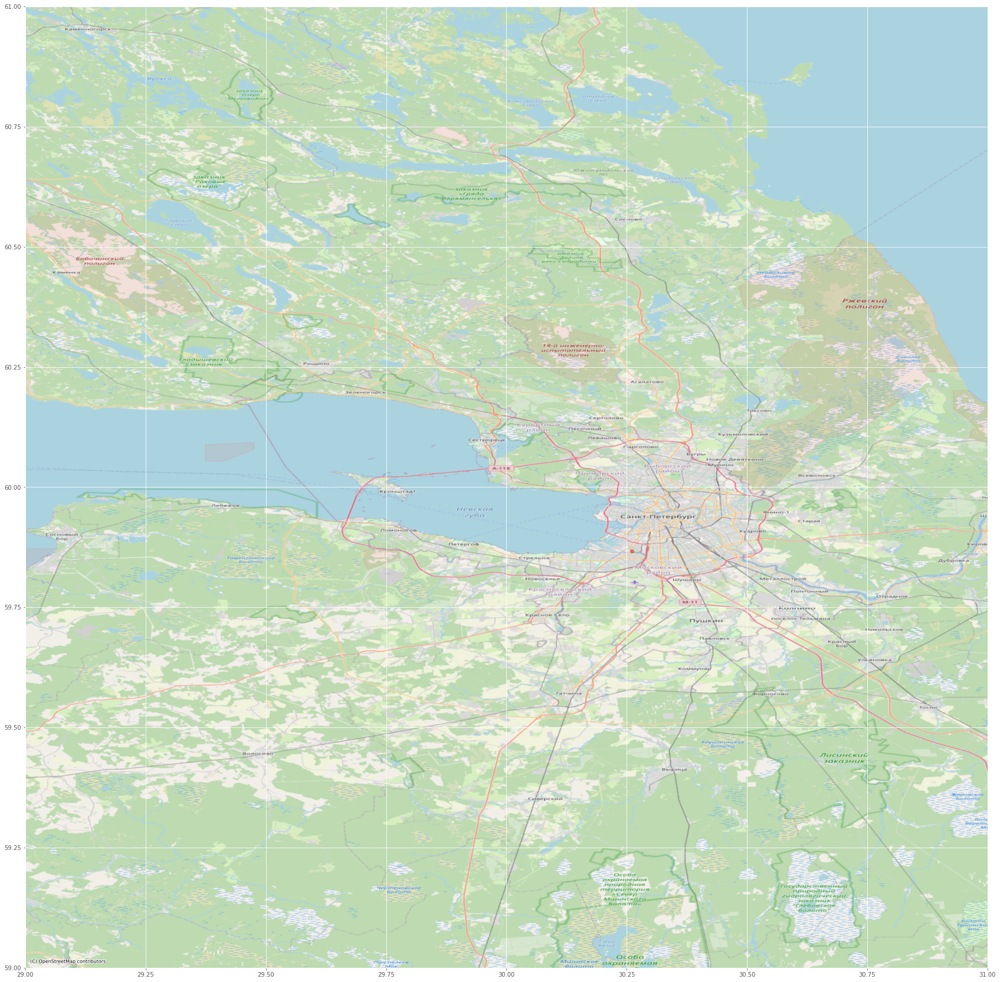

In [28]:
ax = gdf[gdf['ID_STOP'] == 100105].plot(color="red", figsize=(30, 30), alpha=0.5, edgecolor='k')
ax.axis((29, 31, 59, 61))
ctx.add_basemap(ax, crs=gmetro.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik, zoom = 10)

In [31]:
gdf.to_crs(epsg=3310,inplace=True)
gmetro.to_crs(epsg=3310,inplace=True)
near = gdf[gdf.distance(gmetro.geometry[4]) < 1000]
near.to_crs(epsg=4326,inplace=True)
near

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


,ID_STOP,STOP_NAME,LATITUDE,LONGITUDE,geometry
4,100105,Автово,59.8672920598579,30.2611327749718,POINT (30.26113 59.86729)
115,1341,АВТОВСКАЯ УЛ. [72],59.86984952136197,30.2708015,POINT (30.27080 59.86985)
219,14709,"ТРАМВАЙНЫЙ ПРОСПЕКТ [20, 200, 210, 145, 482, 4...",59.85866722935599,30.2529259,POINT (30.25293 59.85867)
224,14715,"УЛ .ЗЕНИТЧИКОВ [66, 72, 2, 20, 200, 229]",59.87445713654413,30.2618408,POINT (30.26184 59.87446)
258,14813,"УЛ. ЗЕНИТЧИКОВ [66, 72, 2, 20, 200, 229] [тест]<",59.87369952939835,30.2624111,POINT (30.26241 59.87370)
437,1507,ДОРОГА НА ТУРУХТАННЫЕ ОСТРОВА [2],59.8695340957828,30.247818,POINT (30.24782 59.86953)
603,15238,Проспект Стачек (20),59.85928456521852,30.2547607,POINT (30.25476 59.85928)
607,15241,"Метро ""Автово"" (20)",59.86770319692409,30.2606983,POINT (30.26070 59.86770)
609,15243,"Комсомольская площадь (20, 41, 46, 48)",59.87370295752386,30.2588997,POINT (30.25890 59.87370)
650,15285,"Комсомольская площадь (20, 41, 46, 48)",59.87490277974223,30.2581005,POINT (30.25810 59.87490)


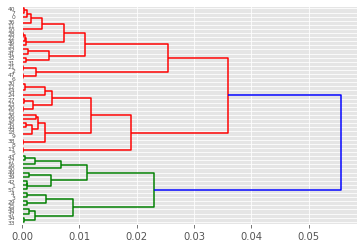

In [40]:
link = linkage(near[['LONGITUDE', 'LATITUDE']], 'ward', 'euclidean')
dn = dendrogram(link, orientation = "right")

In [38]:
dist = link[:, 2]
dist

array([6.65088098e-05, 7.57979258e-05, 7.61335651e-05, 1.06892406e-04,
       1.31761735e-04, 1.57336510e-04, 1.81055720e-04, 2.06787594e-04,
       2.16915098e-04, 3.11053218e-04, 3.55312359e-04, 4.26061956e-04,
       4.68002178e-04, 4.85086957e-04, 5.32128662e-04, 6.86578078e-04,
       7.48540319e-04, 7.85862718e-04, 8.10287856e-04, 8.55601726e-04,
       8.90021877e-04, 8.94735742e-04, 9.48267197e-04, 1.04898314e-03,
       1.20380232e-03, 1.22979409e-03, 1.61122869e-03, 1.67022570e-03,
       1.94806633e-03, 2.28486150e-03, 2.30936342e-03, 2.39451331e-03,
       2.49520368e-03, 2.78275735e-03, 3.49696866e-03, 3.94104341e-03,
       4.08517453e-03, 4.19236939e-03, 4.74746717e-03, 5.04727275e-03,
       5.25846609e-03, 6.77743000e-03, 7.39474029e-03, 8.97154842e-03,
       1.09527990e-02, 1.13845998e-02, 1.19953727e-02, 1.90558284e-02,
       2.29945461e-02, 2.54566294e-02, 3.59986962e-02, 5.55824150e-02])

Text(22, 2.6, '4 clusters')

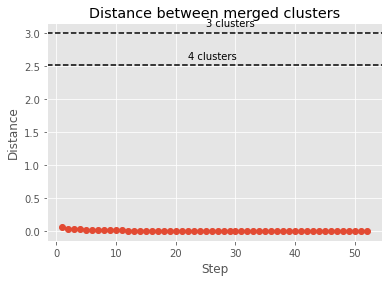

In [41]:
dist_rev = dist[::-1]
idxs = range(1, len(dist) + 1)
plt.plot(idxs, dist_rev, marker='o')
plt.title('Distance between merged clusters')
plt.xlabel('Step')
plt.ylabel('Distance')
plt.axhline(3, c='k', linestyle='dashed')
plt.axhline(2.52, c='k', linestyle='dashed')
plt.text(25, 3.1, '3 clusters')
plt.text(22, 2.6, '4 clusters')

Text(0, 0.5, 'Distance')

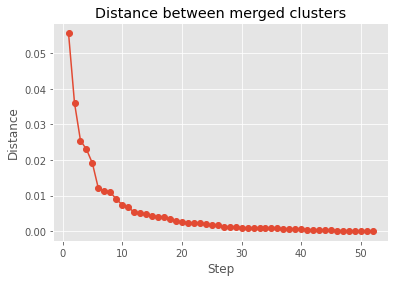

In [42]:
dist_rev = dist[::-1]
idxs = range(1, len(dist) + 1)
plt.plot(idxs, dist_rev, marker='o')
plt.title('Distance between merged clusters')
plt.xlabel('Step')
plt.ylabel('Distance')

In [43]:
near['cluster'] = fcluster(link, 0.008, criterion='distance')
near.sort_values('cluster').head(60)

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


,ID_STOP,STOP_NAME,LATITUDE,LONGITUDE,geometry,cluster
4709,2224,"УЛ. ЗАЙЦЕВА [66, 72]",59.8723693900246,30.265686,POINT (30.26569 59.87237),1
6512,3407,"УЛ. ЗАЙЦЕВА [66, 72]<",59.87165287537201,30.2666855,POINT (30.26669 59.87165),1
2616,18031,КРАСНОПУТИЛОВСКАЯ УЛ. (тест),59.87290076651799,30.2676563,POINT (30.26766 59.87290),1
2633,18052,КРАСНОПУТИЛОВСКАЯ УЛ. (тест)<,59.8730276099738,30.2673244,POINT (30.26732 59.87303),1
1943,16608,"Улица Новостроек Т (36, 41)",59.87635279280877,30.2646503,POINT (30.26465 59.87635),2
2215,16938,"Улица Маршала Говорова Т (36, 41)",59.87591059694482,30.2638779,POINT (30.26388 59.87591),2
224,14715,"УЛ .ЗЕНИТЧИКОВ [66, 72, 2, 20, 200, 229]",59.87445713654413,30.2618408,POINT (30.26184 59.87446),2
258,14813,"УЛ. ЗЕНИТЧИКОВ [66, 72, 2, 20, 200, 229] [тест]<",59.87369952939835,30.2624111,POINT (30.26241 59.87370),2
6798,3918,КРАСНОПУТИЛОВСКАЯ УЛ. УГ. АВТОВСКОЙ УЛ. [],59.86916723835661,30.2702789,POINT (30.27028 59.86917),3
4811,2269,УЛ. МАРИНЕСКО [66],59.86796378044206,30.268301,POINT (30.26830 59.86796),3


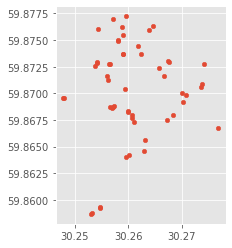

In [44]:
near.plot(markersize=20)

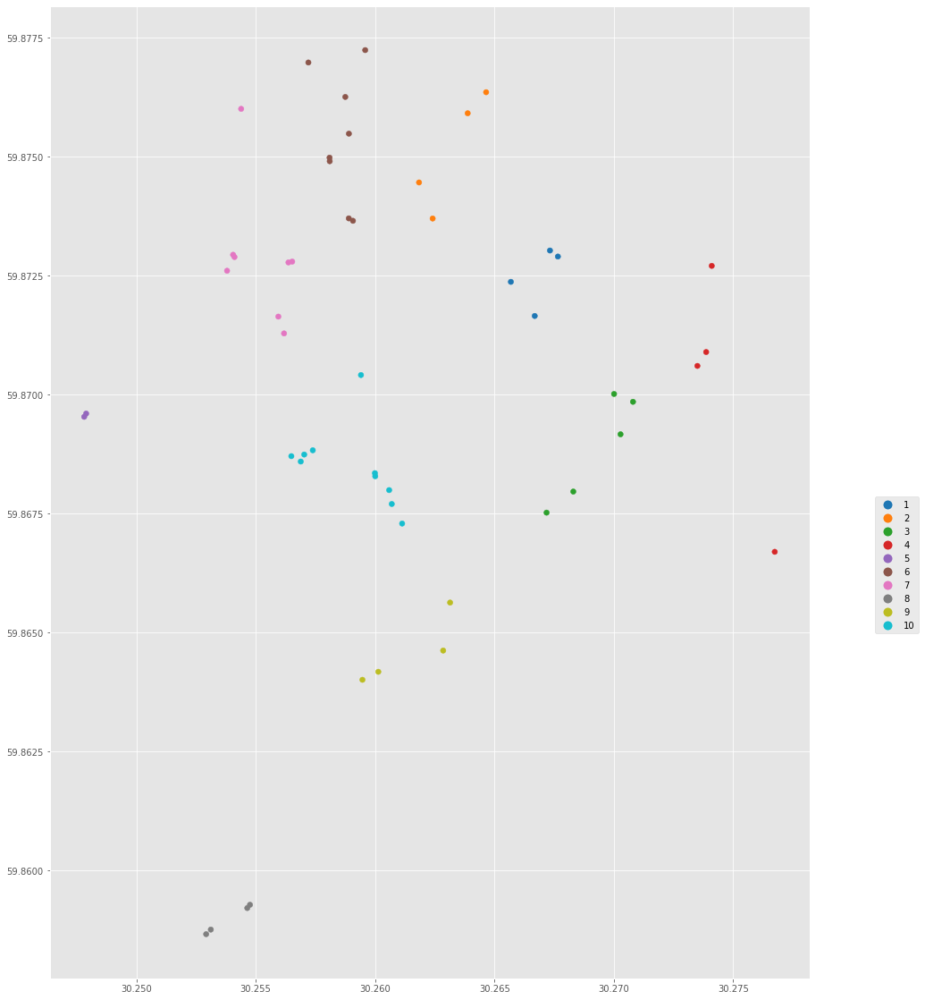

In [45]:
fig, ax = plt.subplots(figsize=(20, 20))

near.plot(column='cluster',
                categorical=True,
                legend=True,
                ax=ax)

# Adjust legend location
leg = ax.get_legend()
leg.set_bbox_to_anchor((1.15,0.5))

plt.show()

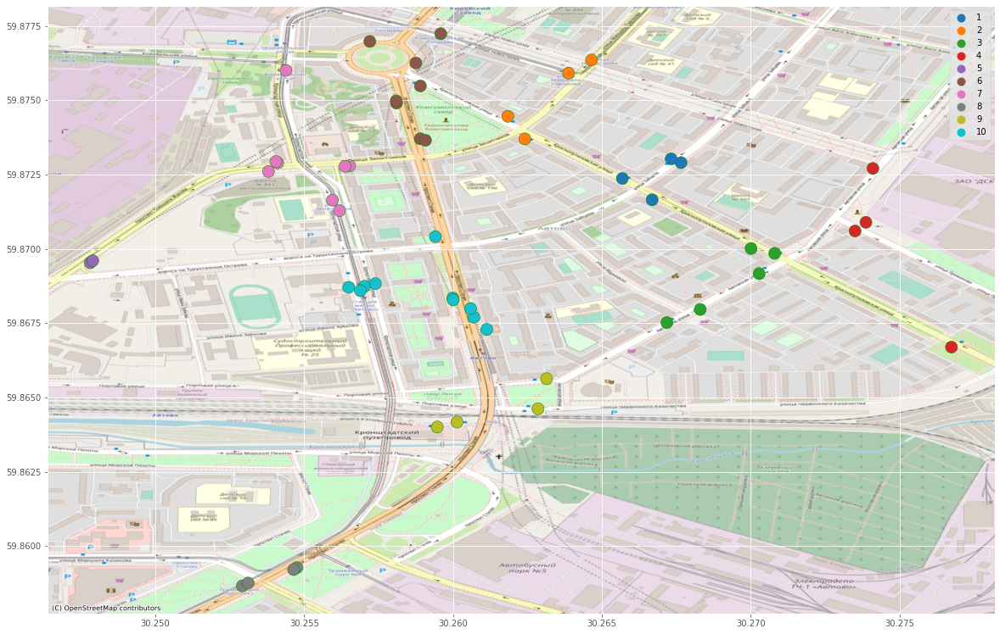

In [46]:
ax = near.plot(column='cluster',
                categorical=True,
                legend=True,
               figsize=(20, 30), alpha=1, edgecolor='g', markersize= 200)
ctx.add_basemap(ax, 
                crs=near.crs.to_string(), 
                source=ctx.providers.OpenStreetMap.Mapnik)

In [52]:
near = gdf[gdf.distance(gmetro.geometry[45]) < 1000]
near
near.to_crs(epsg=4326,inplace=True)

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [53]:
link = linkage(near[['LONGITUDE', 'LATITUDE']], 'ward', 'euclidean')

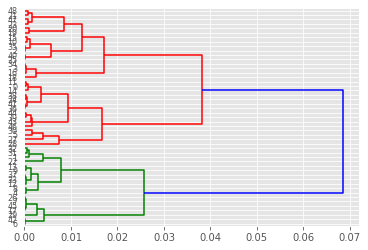

In [54]:
dn = dendrogram(link, orientation = "right")

In [55]:
dist = link[:, 2]
dist

array([2.00297278e-05, 3.55022267e-05, 9.29463473e-05, 1.05754653e-04,
       1.26812715e-04, 1.48957256e-04, 1.77057830e-04, 1.99458915e-04,
       2.49318060e-04, 2.68155398e-04, 2.82646707e-04, 3.16700014e-04,
       3.31862911e-04, 3.43521262e-04, 3.79887175e-04, 3.87009085e-04,
       5.04782488e-04, 5.29554658e-04, 5.57907231e-04, 6.61109103e-04,
       7.22714330e-04, 7.73825744e-04, 1.01465221e-03, 1.04233152e-03,
       1.13480393e-03, 1.35715958e-03, 1.41883258e-03, 1.66957873e-03,
       1.70452432e-03, 1.71090858e-03, 2.51937945e-03, 2.72697603e-03,
       2.90799526e-03, 3.48143250e-03, 3.97141957e-03, 4.09139323e-03,
       4.18254935e-03, 5.67226552e-03, 7.52383680e-03, 7.94431603e-03,
       8.60412885e-03, 9.47271243e-03, 1.24274911e-02, 1.66174027e-02,
       1.72065504e-02, 2.56852812e-02, 3.82607117e-02, 6.85816444e-02])

Text(22, 2.6, '4 clusters')

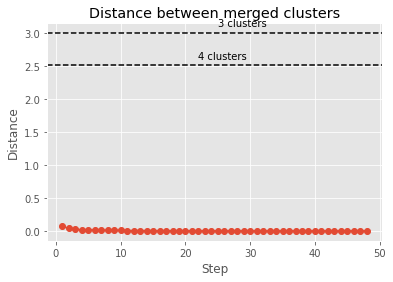

In [57]:
dist_rev = dist[::-1]
idxs = range(1, len(dist) + 1)
plt.plot(idxs, dist_rev, marker='o')
plt.title('Distance between merged clusters')
plt.xlabel('Step')
plt.ylabel('Distance')
plt.axhline(3, c='k', linestyle='dashed')
plt.axhline(2.52, c='k', linestyle='dashed')
plt.text(25, 3.1, '3 clusters')
plt.text(22, 2.6, '4 clusters')

Text(0, 0.5, 'Distance')

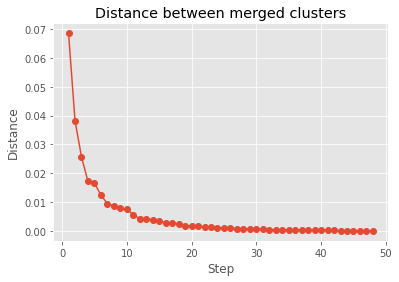

In [56]:
dist_rev = dist[::-1]
idxs = range(1, len(dist) + 1)
plt.plot(idxs, dist_rev, marker='o')
plt.title('Distance between merged clusters')
plt.xlabel('Step')
plt.ylabel('Distance')


In [58]:
near['cluster'] = fcluster(link, 0.005, criterion='distance')
near.sort_values('cluster').head(60)

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


,ID_STOP,STOP_NAME,LATITUDE,LONGITUDE,geometry,cluster
6674,3610,"УНИВЕРСИТЕТСКАЯ НАБ.,УГ. 1-Й И КАДЕТСКОЙ ЛИНИИ...",59.93951258376022,30.2930851,POINT (30.29309 59.93951),1
5502,2496,"1 ЛИНИЯ, УГ. БОЛЬШОГО ПР. В.О. [7]<",59.94093240849512,30.2915783,POINT (30.29158 59.94093),1
2127,16784,Большой просп. В.О. / 1-я и Кадетская линии (1...,59.94068608181551,30.2913933,POINT (30.29139 59.94069),1
828,15463,"Большой проспект В.О. (10, 11)",59.94080240297558,30.2916985,POINT (30.29170 59.94080),1
823,15459,"Кадетская линия (1, 10, 11)",59.93950231974564,30.2931023,POINT (30.29310 59.93950),1
5708,2595,"БОЛЬШОЙ ПР. В.О. [6, 1, 7]<",59.94224611988179,30.2899113,POINT (30.28991 59.94225),1
7057,4698,"1-Я ЛИНИЯ В.О., УГ. БОЛЬШОГО ПР. В.О. (тест)",59.94081266658775,30.2914009,POINT (30.29140 59.94081),1
78,1290,"1-Я И КАДЕТСКАЯ ЛИНИЯ,УГ. СРЕДНЕГО ПР. [6]",59.94453814792944,30.2870083,POINT (30.28701 59.94454),2
829,15464,Средний проспект (1),59.94469208443339,30.2867012,POINT (30.28670 59.94469),2
1034,1569,КАДЕТСКАЯ ЛИНИЯ УГ. СРЕДНЕГО ПР. [1],59.94587224055173,30.2857113,POINT (30.28571 59.94587),2


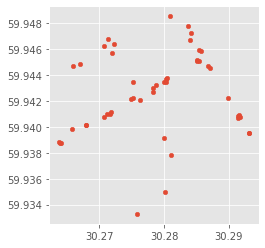

In [59]:
near.plot(markersize=20)

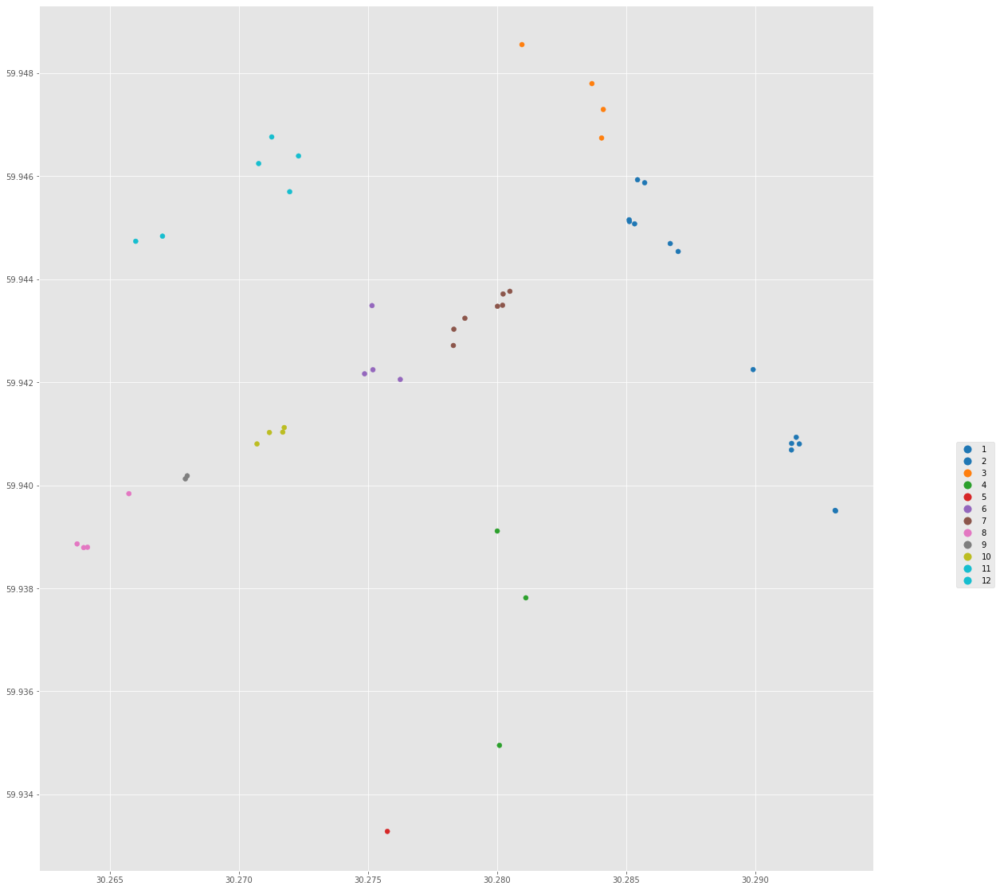

In [60]:
fig, ax = plt.subplots(figsize=(20, 20))

near.plot(column='cluster',
                categorical=True,
                legend=True,
                ax=ax)

# Adjust legend location
leg = ax.get_legend()
leg.set_bbox_to_anchor((1.15,0.5))

plt.show()

In [ ]:
ax = near.plot(column='cluster',
                categorical=True,
                legend=True,
               figsize=(30, 30), alpha=1, edgecolor='g', markersize= 200)
ctx.add_basemap(ax, 
                crs=near.crs.to_string(), 
                source=ctx.providers.OpenStreetMap.Mapnik)

In [ ]:
near = gdf[gdf.distance(gmetro.geometry[45]) < 1000]
near
near.to_crs(epsg=4326,inplace=True)

In [ ]:
link = linkage(near[['LONGITUDE', 'LATITUDE']], 'ward', 'euclidean')

In [ ]:
dn = dendrogram(link, orientation = "right")

In [ ]:
near['cluster'] = fcluster(link, 0.005, criterion='distance')
near.sort_values('cluster').head(60)

In [ ]:
near.plot(markersize=20)

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))

near.plot(column='cluster',
                categorical=True,
                legend=True,
                ax=ax)

# Adjust legend location
leg = ax.get_legend()
leg.set_bbox_to_anchor((1.15,0.5))

plt.show()

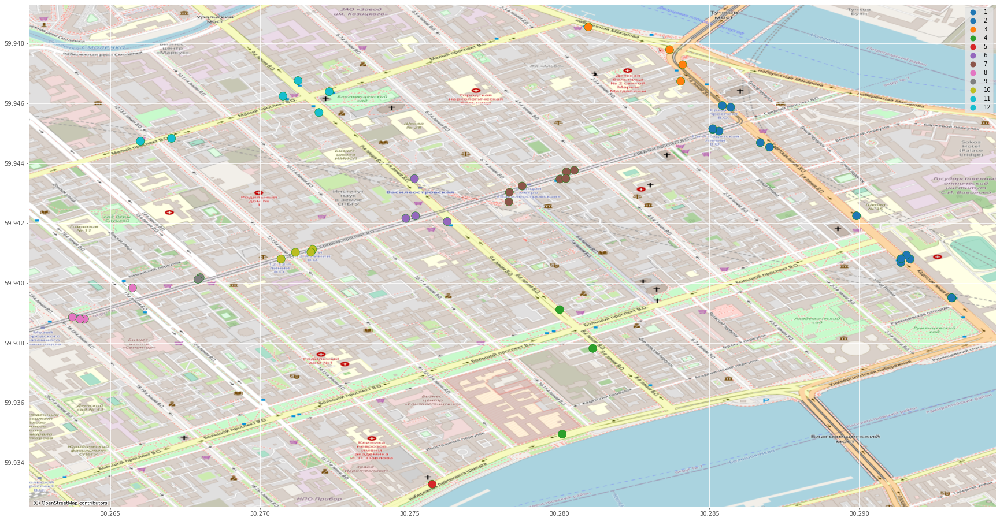

In [61]:
ax = near.plot(column='cluster',
                categorical=True,
                legend=True,
               figsize=(30, 30), alpha=1, edgecolor='g', markersize= 200)
ctx.add_basemap(ax, 
                crs=near.crs.to_string(), 
                source=ctx.providers.OpenStreetMap.Mapnik)